Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

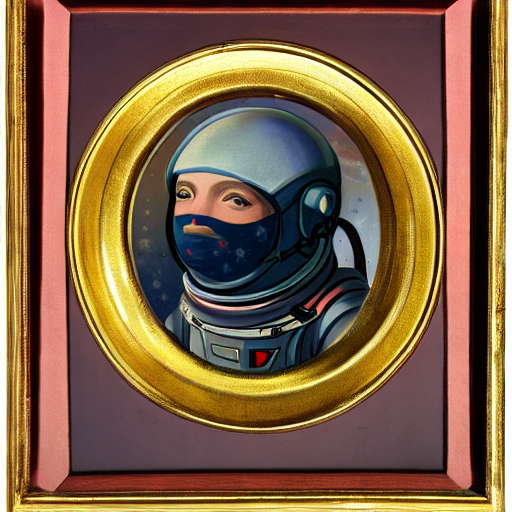

In [5]:
from diffusers import StableDiffusionPipeline
import torch

model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float32)
pipe = pipe.to("cuda")

prompt = "Renaissance-style portrait of an astronaut in space, detailed starry background, reflective helmet."
image = pipe(prompt).images[0]

image


In [6]:
pipe


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.24.0",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [2]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

vae = AutoencoderKL.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="vae")
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")
unet = UNet2DConditionModel.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="unet")
scheduler = PNDMScheduler.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="scheduler")

torch_device = "cuda"
vae.to(torch_device)
text_encoder.to(torch_device)
unet.to(torch_device)


UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): LoRACompatibleLinear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): LoRACompatibleLinear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): LoRACompatibleConv(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): LoRACompatibleLinear(in_features=320, out_features=320, bias=False)
                (to_k): LoRACompatibleLinear(in_features=320, out_features=320

In [3]:
import torch

prompt = ["Renaissance-style portrait of an astronaut in space, detailed starry background, reflective helmet."]
height = 512  # default height of Stable Diffusion
width = 512  # default width of Stable Diffusion
num_inference_steps = 25  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
generator = torch.manual_seed(42)  # Seed generator to create the inital latent noise
batch_size = len(prompt)


In [4]:
text_input = tokenizer(
    prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt"
)

with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

text_embeddings = torch.cat([uncond_embeddings, text_embeddings])


In [5]:
latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
)
latents = latents.to(torch_device)

latents = latents * scheduler.init_noise_sigma


/tmp/ipykernel_1516/2400775115.py:2: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


In [6]:
import PIL
import torch
import numpy as np
from PIL import Image
from IPython.display import display

def display_denoised_sample(sample, i):
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)

    image_pil = PIL.Image.fromarray(image_processed[0])
    display(f"Denoised Sample @ Step {i}")
    display(image_pil)
    return image_pil

def display_decoded_image(latents, i):
  # scale and decode the image latents with vae
  latents = 1 / 0.18215 * latents
  with torch.no_grad():
    image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    display(f"Decoded Image @ step {i}")
    display(pil_images[0])
    return pil_images[0]


  0%|          | 0/26 [00:00<?, ?it/s]

'Denoised Sample @ Step 0'

ValueError: Could not save to JPEG for display

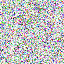

'Decoded Image @ step 0'

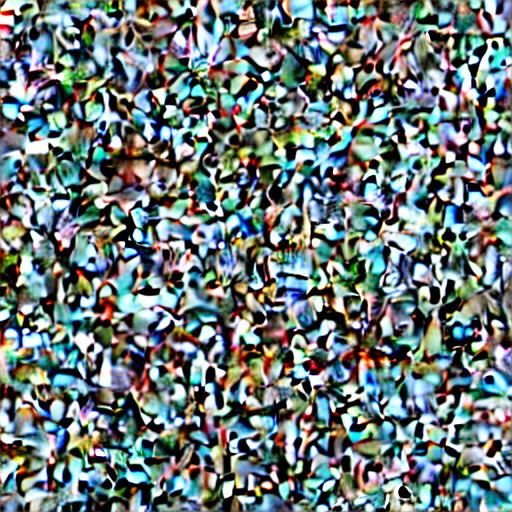

'Denoised Sample @ Step 5'

ValueError: Could not save to JPEG for display

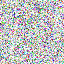

'Decoded Image @ step 5'

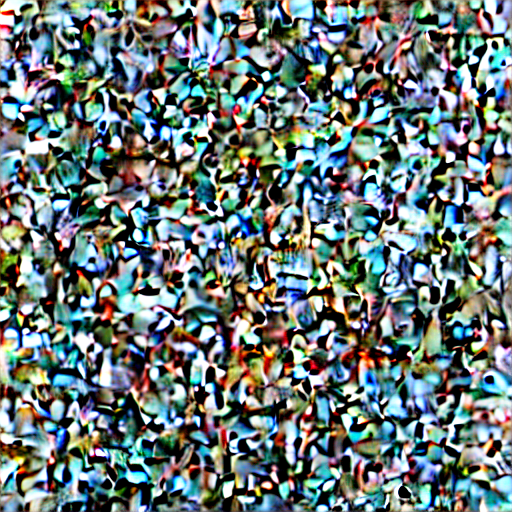

'Denoised Sample @ Step 10'

ValueError: Could not save to JPEG for display

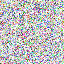

'Decoded Image @ step 10'

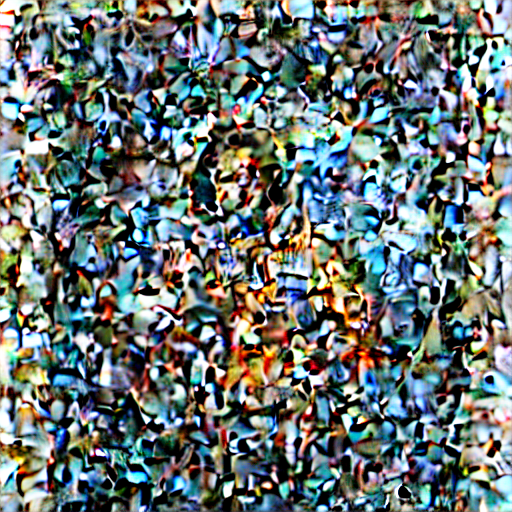

'Denoised Sample @ Step 15'

ValueError: Could not save to JPEG for display

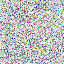

'Decoded Image @ step 15'

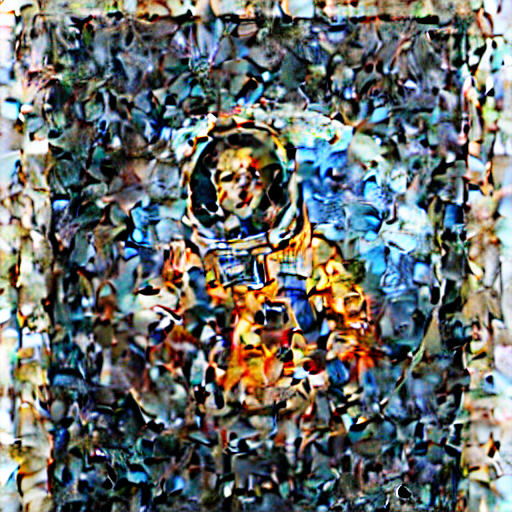

'Denoised Sample @ Step 20'

ValueError: Could not save to JPEG for display

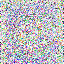

'Decoded Image @ step 20'

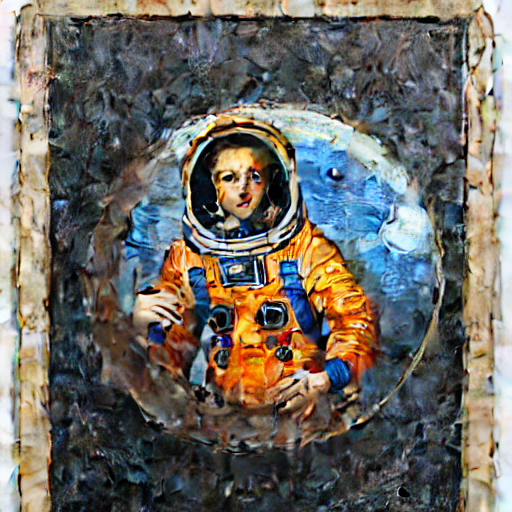

'Denoised Sample @ Step 25'

ValueError: Could not save to JPEG for display

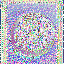

'Decoded Image @ step 25'

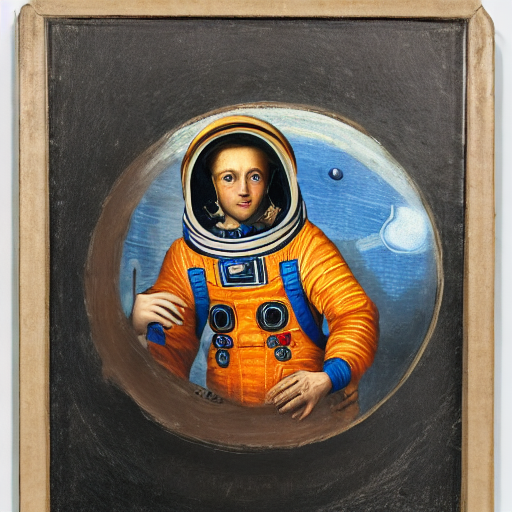

In [7]:
from tqdm.auto import tqdm

scheduler.set_timesteps(num_inference_steps)

denoised_images = []
decoded_images = []
for i, t in enumerate(tqdm(scheduler.timesteps)):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)

    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample
    if i % 5 == 0:
      denoised_image = display_denoised_sample(latents, i)
      decoded_image = display_decoded_image(latents, i)
      denoised_images.append(denoised_image)
      decoded_images.append(decoded_image)


In [8]:
print(latents.shape)
latents = 1 / 0.18215 * latents
with torch.no_grad():
    image = vae.decode(latents).sample
    print(image.shape)


torch.Size([1, 4, 64, 64])
torch.Size([1, 3, 512, 512])


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/40 [00:00<?, ?it/s]

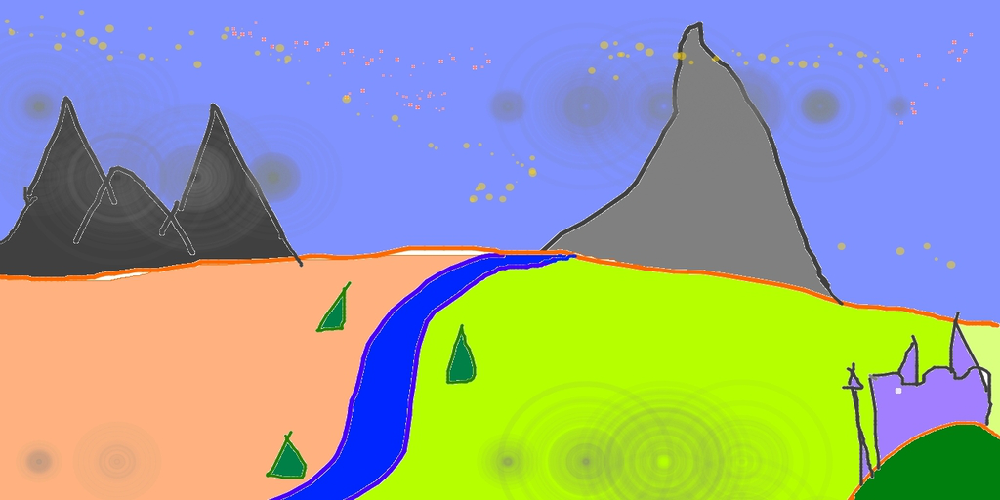

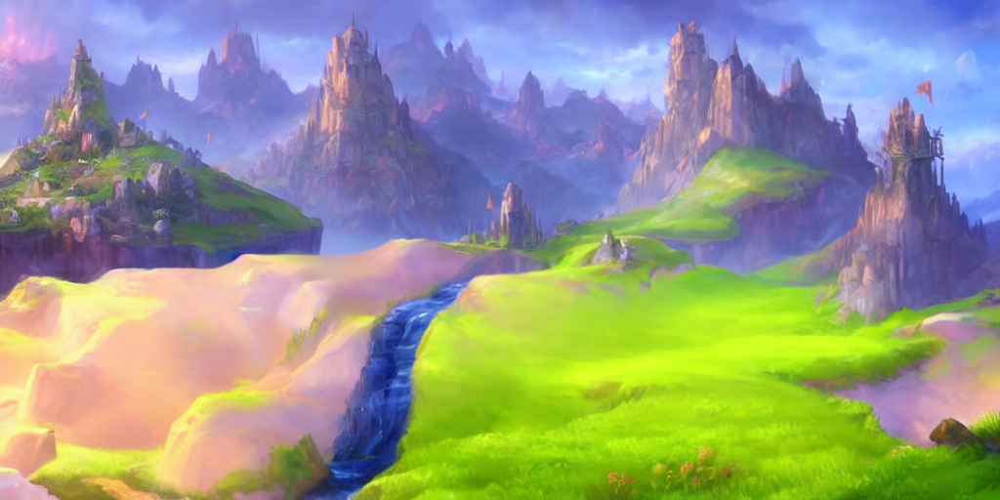

In [1]:
import torch
from PIL import Image

from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
model_id_or_path = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(model_id_or_path, torch_dtype=torch.float16)
pipe = pipe.to(device)

image_file = "./data/sketch-mountains-input.jpg"

# Using a higher resolution image if possible
init_image = Image.open(image_file).convert("RGB")
# Consider keeping the original image resolution or increasing it if computational resources allow
# init_image = init_image.resize((desired_width, desired_height))

prompt = "A fantasy landscape, trending on artstation."

# Adjusting the strength and guidance_scale parameters
images = pipe(prompt=prompt, image=init_image, strength=0.8, guidance_scale=10).images

display(init_image)
display(images[0])


  0%|          | 0/37 [00:00<?, ?it/s]

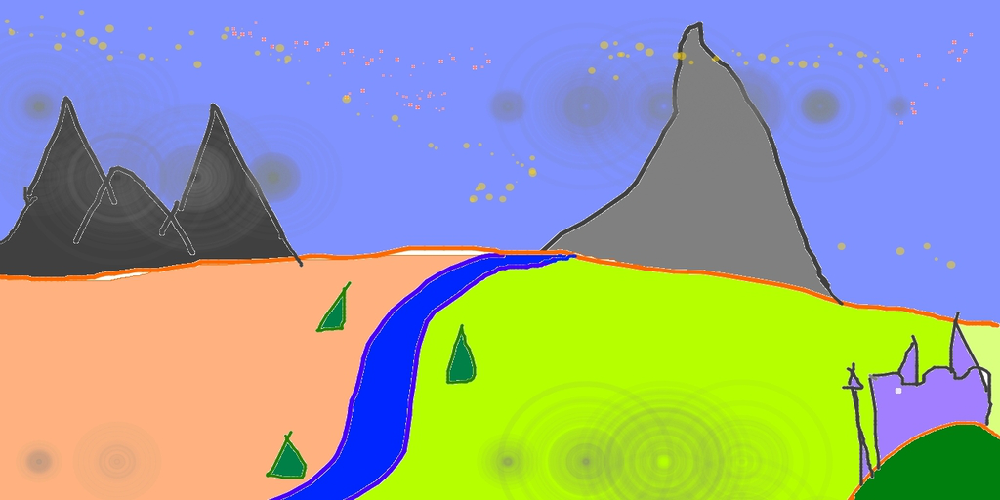

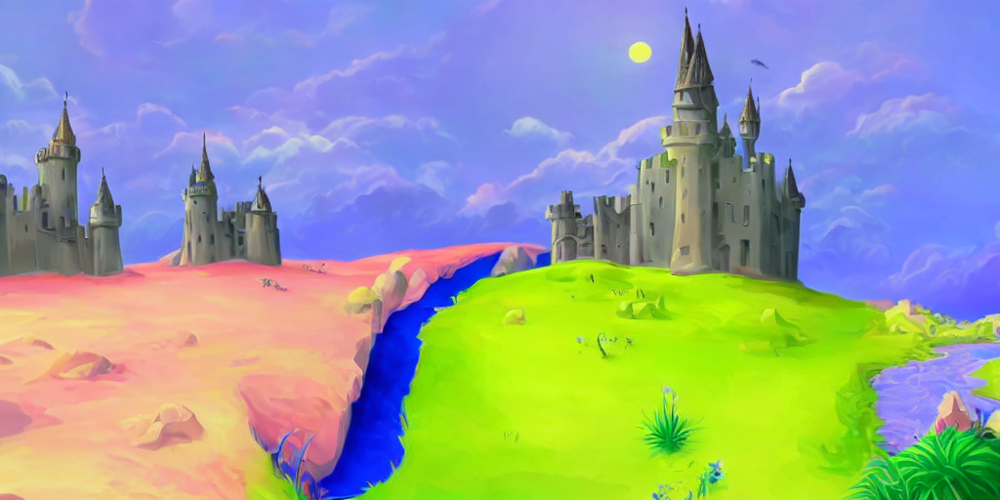

In [2]:
prompt = "surreal style, a fantasy landscape with castles"
images = pipe(prompt=prompt, image=init_image, strength=0.75, guidance_scale=7.5).images

display(init_image)
display(images[0])


  0%|          | 0/40 [00:00<?, ?it/s]

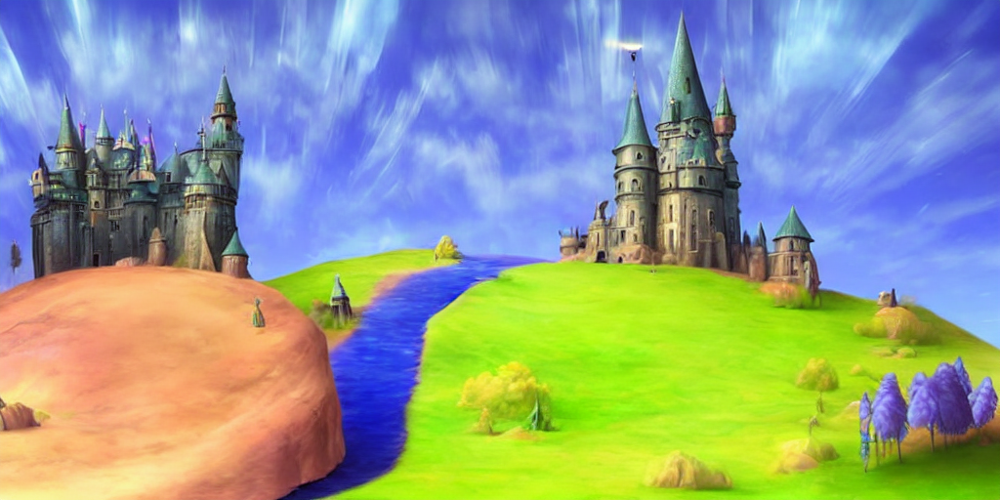

In [5]:
prompt = "surreal style, a fantasy landscape with castles"
negative_prompt = "river"
images = pipe(prompt=prompt, negative_prompt=negative_prompt, image=init_image, strength=0.8, guidance_scale=7.5).images

display(images[0])


vae/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

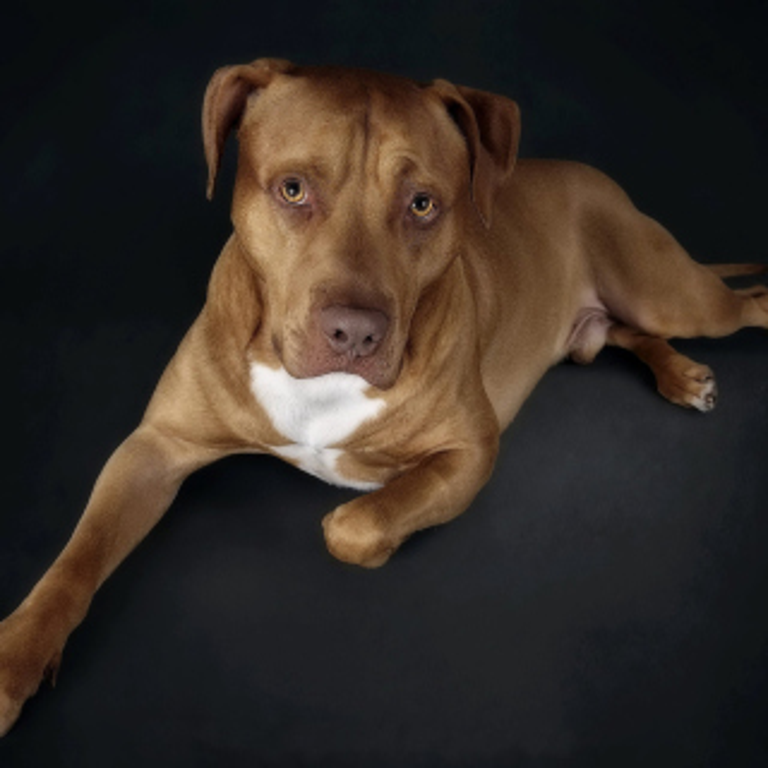

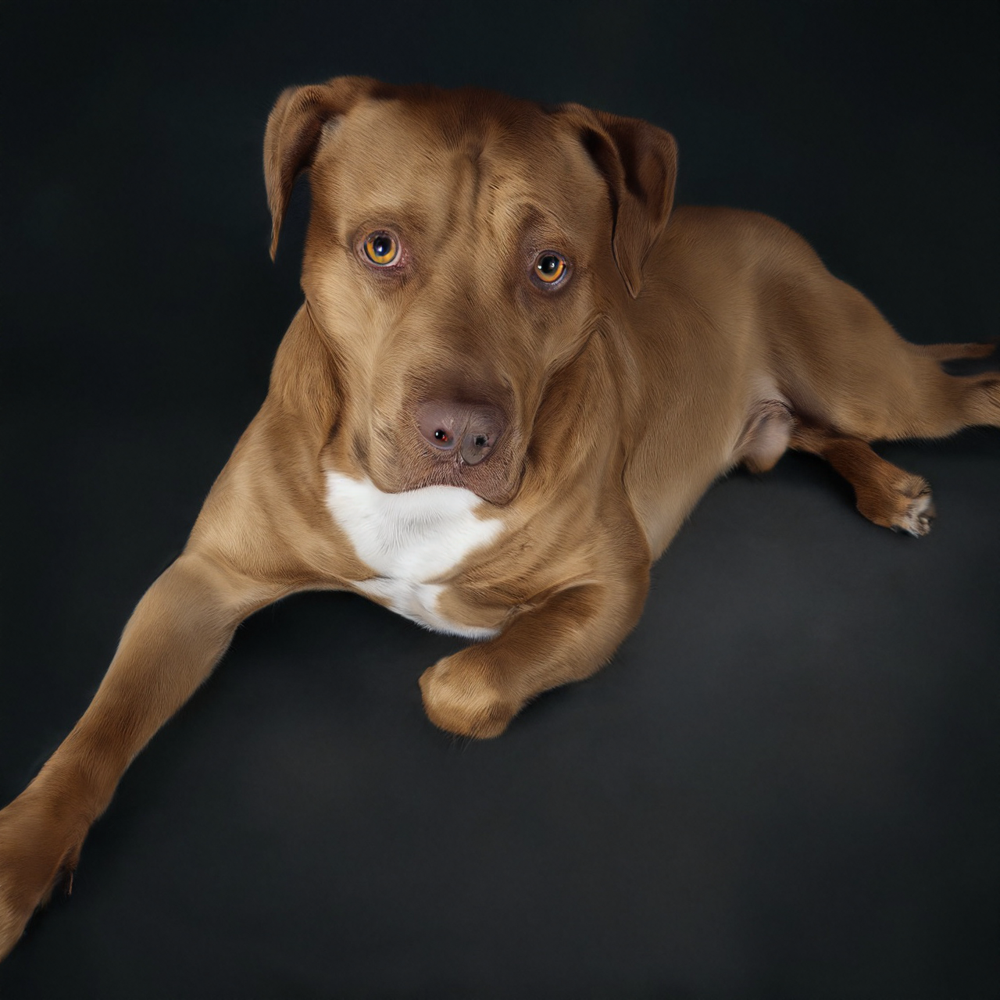

In [8]:
from diffusers import StableDiffusionUpscalePipeline

# load model and scheduler
model_id = "stabilityai/stable-diffusion-x4-upscaler"
pipeline = StableDiffusionUpscalePipeline.from_pretrained(
    model_id, revision="fp16", torch_dtype=torch.float16
)
pipeline = pipeline.to("cuda")

# let's download an  image
low_res_img_file = "./data/Companion-dog-square-l.jpg"
low_res_img = Image.open(low_res_img_file).convert("RGB")
low_res_img = low_res_img.resize((320, 320))

prompt = "The image shows a brown dog with soulful eyes, lying down and looking directly at the camera against a dark background."

upscaled_image = pipeline(prompt=prompt, image=low_res_img).images[0]

low_res_img_resized = low_res_img.resize((768, 768))

display(low_res_img_resized)
display(upscaled_image)


In [9]:
pipeline


StableDiffusionUpscalePipeline {
  "_class_name": "StableDiffusionUpscalePipeline",
  "_diffusers_version": "0.24.0",
  "_name_or_path": "stabilityai/stable-diffusion-x4-upscaler",
  "feature_extractor": [
    null,
    null
  ],
  "low_res_scheduler": [
    "diffusers",
    "DDPMScheduler"
  ],
  "max_noise_level": 350,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ],
  "watermarker": [
    null,
    null
  ]
}